# CarNet

Welcome to the final assignment in this course. It's been a long journey, but you are now ready to unleash the powers of neural networks at any task. In this assignment, we will be working with a collection of photos related to driving vehicles.

In [2]:
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context('talk')
%config InlineBackend.figure_format = 'retina'

# Download Data and build dataset

The dataset consists of 2 segments: 
* train: the metadata file contains the file names and the count of different objects in each image.
* score: the metadata file contains the file names of images to be used for the final predictions.

Target variables (in this order):
1. signal
2. vehicle

These target variables are defined as follows:
* signal =  traffic light + stop sign
* vehicle = car + bus + truck + train + motorcycle + bicycle + airplane + boat

In [3]:
#!aws s3 cp s3://danylo-ucla/carnet_dataset.zip ./
#!unzip -u -q carnet_dataset.zip

In [4]:
train_metadata = pd.read_csv('carnet_dataset/train/metadata.csv')
train_metadata

,car,bus,truck,train,motorcycle,bicycle,airplane,boat,traffic light,stop sign,vehicle,signal,file_name
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,000000000064.jpg
1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,000000000073.jpg
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,000000000074.jpg
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,000000000081.jpg
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,000000000086.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,000000581835.jpg
23224,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,000000581881.jpg
23225,7.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,8.0,2.0,000000581887.jpg
23226,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,000000581900.jpg


In [5]:
# Score metadata defines the expected order of the photos in the submitted predictions file.

score_metadata = pd.read_csv('carnet_dataset/score/metadata.csv')
score_metadata

,file_name
0,000000000071.jpg
1,000000000149.jpg
2,000000000260.jpg
3,000000000307.jpg
4,000000000690.jpg
...,...
5761,000000581326.jpg
5762,000000581539.jpg
5763,000000581738.jpg
5764,000000581770.jpg


In [6]:
!tree -L 2 carnet_dataset

carnet_dataset
├── score
│   ├── images
│   └── metadata.csv
└── train
    ├── images
    └── metadata.csv

4 directories, 2 files


In [7]:
import pandas as pd

# Load the dataset
train_dataset = pd.read_csv('carnet_dataset/train/metadata.csv')

# Calculate split sizes
train_size = int(0.8 * len(train_dataset))
val_size = int(0.1 * len(train_dataset))

# Split the dataset using slicing
train_metadata = train_dataset.iloc[:train_size]
val_metadata = train_dataset.iloc[train_size:train_size + val_size]
test_metadata = train_dataset.iloc[train_size + val_size:]

# Optional: Print sizes to verify
print(f"Training set size: {len(train_metadata)}")
print(f"Validation set size: {len(val_metadata)}")
print(f"Test set size: {len(test_metadata)}")

Training set size: 18582
Validation set size: 2322
Test set size: 2324


([], [])

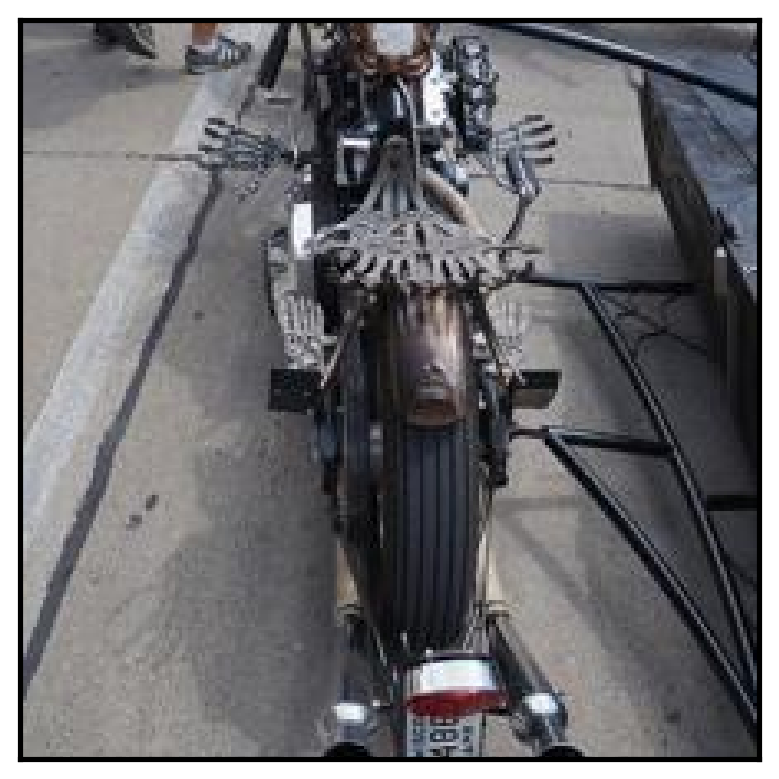

In [8]:
import random
from PIL import Image
#random.seed(44)
i = random.randint(0, train_metadata.shape[0])
file_name_training = train_metadata['file_name'].iloc[i]



plt.imshow(Image.open(f'carnet_dataset/train/images/{file_name_training}'))
plt.xticks([])
plt.yticks([])



In [9]:
from collegium.m05_ensemble.utils.dataset import build_dataset, build_score_dataset
import tensorflow as tf
import os
# Optional: Add batching, shuffling, etc.
batch_size=32
image_dir = 'carnet_dataset/train/images'
train_dataset = build_dataset(train_metadata, image_dir).batch(batch_size).prefetch(tf.data.AUTOTUNE)
val_dataset = build_dataset(val_metadata, image_dir).batch(batch_size).prefetch(tf.data.AUTOTUNE)
test_dataset = build_dataset(test_metadata, image_dir).batch(batch_size).prefetch(tf.data.AUTOTUNE)
image_dir = 'carnet_dataset/score/images'
score_dataset = build_score_dataset(score_metadata, image_dir).batch(batch_size).prefetch(tf.data.AUTOTUNE)




I0000 00:00:1730701540.436907    1650 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355


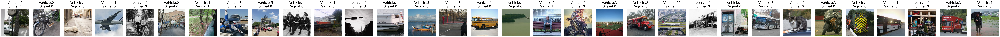

Batch image shape: (32, 224, 224, 3)
Batch labels shape: (TensorShape([32]), TensorShape([32]))


In [66]:
import keras

# Get a batch sample
batch_x, batch_y = next(iter(train_dataset))

# Visualize batch
plt.figure(figsize=(75, 25))
for i in range(batch_size):
    plt.subplot(1, batch_size, i + 1)
    plt.imshow(batch_x[i])
    plt.title(f'Vehicle:{batch_y[0][i].numpy()}\nSignal:{batch_y[1][i].numpy()}')
    plt.axis('off')
plt.tight_layout()
plt.show()

# Print batch shapes
print("Batch image shape:", batch_x.shape)
print("Batch labels shape:", (batch_y[0].shape, batch_y[1].shape))

## Yolov8 single shot

# Model Architecture

### testing Yolov8

000000167033.jpg
TRUE vehicle: 3.0 ; signal:  1.0
car                           0.0
bus                           2.0
truck                         1.0
train                         0.0
motorcycle                    0.0
bicycle                       0.0
airplane                      0.0
boat                          0.0
traffic light                 0.0
stop sign                     1.0
vehicle                       3.0
signal                        1.0
file_name        000000167033.jpg
Name: 6673, dtype: object

Detected counts:
#Vehicles: 3
#Signals: 0


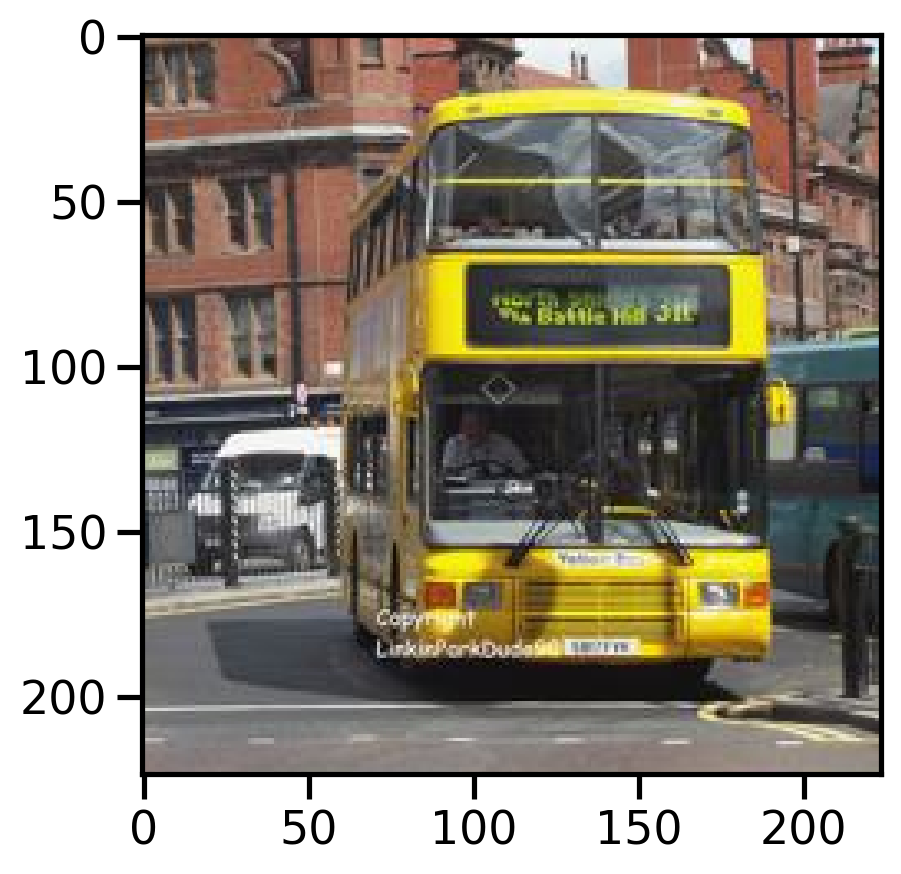

In [77]:
# Import required libraries
#!pip install ultralytics
# Import required libraries
import ultralytics
from ultralytics import YOLO
import numpy as np

def count_vehicles_and_signals(image_path):
    # Load the pre-trained YOLOv8 model
    model = YOLO('yolov8x.pt')
    models = [
        YOLO('yolov8n.pt'),
        YOLO('yolov8l.pt'),
        YOLO('yolov8m.pt'),
        YOLO('yolov8x.pt'),
    ]
    

    vehicle_classes = [2, 3, 4, 5, 6, 7, 8]  # bicycle, car, motorcycle, airplane, bus, train, truck, boat
    signal_classes = [9, 11]  # traffic light, stop sign
    
    # Perform inference on the image
    results = model.predict(
        source=image_path,
        conf=0.5,  # Confidence threshold
        iou=0.4,  # Adjust IOU threshold
        classes=vehicle_classes + signal_classes,  # Only detect vehicles and signals
        verbose=False
    )
    
    # Get the detection results
    result = results[0]
    
    # Initialize counters
    vehicle_count = 0
    signal_count = 0
    
    # Count objects by category
    for box in result.boxes:
        class_id = int(box.cls[0])
        if class_id in vehicle_classes:
            vehicle_count += 1
        elif class_id in signal_classes:
            signal_count += 1
    
    return {
        "vehicles": vehicle_count,
        "signals": signal_count
    }

# Example usage
random.seed(90)
i = random.randint(0, train_metadata.shape[0])
file_name_training = train_metadata['file_name'].iloc[i]
print (file_name_training)


#plt.imshow(Image.open(f'carnet_dataset/train/images/{file_name_training}'))

image_path = 'carnet_dataset/train/images/'+file_name_training
plt.imshow(Image.open(f'carnet_dataset/train/images/{file_name_training}'))
print('TRUE vehicle:',train_metadata['vehicle'][i],'; signal: ', train_metadata['signal'][i])
print(train_metadata.loc[i])
# Get counts
counts = count_vehicles_and_signals(image_path)
print("\nDetected counts:")
print(f"#Vehicles: {counts['vehicles']}")
print(f"#Signals: {counts['signals']}")

### Evaluate Yolov8

In [87]:
from ultralytics import YOLO
import numpy as np
from tqdm import tqdm

def evaluate_dataset(model, dataset):
    # Initialize arrays to store all predictions and ground truth
    all_true_vehicles = []
    all_true_signals = []
    all_pred_vehicles = []
    all_pred_signals = []
    
    # Define vehicle and signal classes
    vehicle_classes = [2, 3, 4, 5, 6, 7, 8]
    signal_classes = [9, 11]
    
    # Process each batch
    for batch_x, batch_y in tqdm(dataset):
        # Get ground truth
        true_vehicles = batch_y[0].numpy()
        true_signals = batch_y[1].numpy()
        
        # Process each image in the batch
        batch_pred_vehicles = []
        batch_pred_signals = []
        
        for img in batch_x:
            # Convert tensor to numpy array if needed
            if isinstance(img, tf.Tensor):
                img = img.numpy()
            
            # Perform inference
            #results = model.predict(source=img, conf=0.25, verbose=False)
            results = model.predict(
                source=image_path,
                conf=0.5,  # Confidence threshold
                iou=0.4,  # Adjust IOU threshold
                classes=vehicle_classes + signal_classes,  # Only detect vehicles and signals
                verbose=False
            )
            result = results[0]
            
            # Count objects
            vehicle_count = sum(1 for box in result.boxes if int(box.cls[0]) in vehicle_classes)
            signal_count = sum(1 for box in result.boxes if int(box.cls[0]) in signal_classes)
            
            batch_pred_vehicles.append(vehicle_count)
            batch_pred_signals.append(signal_count)
        
        # Append batch results
        all_true_vehicles.extend(true_vehicles)
        all_true_signals.extend(true_signals)
        all_pred_vehicles.extend(batch_pred_vehicles)
        all_pred_signals.extend(batch_pred_signals)
    
    # Convert to numpy arrays
    all_true_vehicles = np.array(all_true_vehicles)
    all_true_signals = np.array(all_true_signals)
    all_pred_vehicles = np.array(all_pred_vehicles)
    all_pred_signals = np.array(all_pred_signals)
    
    # Calculate MSE for vehicles and signals
    vehicle_mse = np.mean(np.square(all_true_vehicles - all_pred_vehicles))
    signal_mse = np.mean(np.square(all_true_signals - all_pred_signals))
    
    # Calculate weighted MSE
    weighted_mse = 0.5 * vehicle_mse + 0.5 * signal_mse
    
    return {
        'weighted_mse': weighted_mse,
        'vehicle_mse': vehicle_mse,
        'signal_mse': signal_mse,
        'predictions': {
            'vehicles': all_pred_vehicles,
            'signals': all_pred_signals
        },
        'ground_truth': {
            'vehicles': all_true_vehicles,
            'signals': all_true_signals
        }
    }

# Load model
model = YOLO('yolov8x.pt')

# Evaluate on training dataset
#print("Evaluating training dataset...")
train_results = evaluate_dataset(model, train_dataset)



581it [19:19,  1.99s/it]



Training Dataset Results:
Weighted MSE: 8.7500
Vehicle MSE: 15.0828
Signal MSE: 2.4172


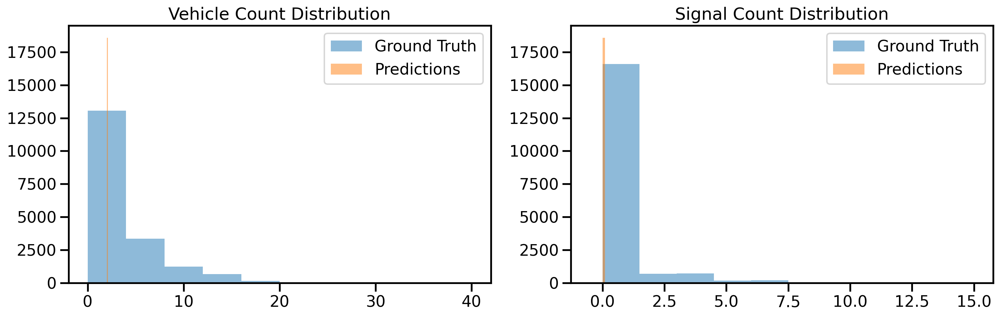

In [75]:
# Print results
print("\nTraining Dataset Results:")
print(f"Weighted MSE: {train_results['weighted_mse']:.4f}")
print(f"Vehicle MSE: {train_results['vehicle_mse']:.4f}")
print(f"Signal MSE: {train_results['signal_mse']:.4f}")

# Optional: Visualize distribution of predictions vs ground truth
plt.figure(figsize=(15, 5))

# Vehicle counts distribution
plt.subplot(1, 2, 1)
plt.hist(train_results['ground_truth']['vehicles'], alpha=0.5, label='Ground Truth')
plt.hist(train_results['predictions']['vehicles'], alpha=0.5, label='Predictions')
plt.title('Vehicle Count Distribution')
plt.legend()

# Signal counts distribution
plt.subplot(1, 2, 2)
plt.hist(train_results['ground_truth']['signals'], alpha=0.5, label='Ground Truth')
plt.hist(train_results['predictions']['signals'], alpha=0.5, label='Predictions')
plt.title('Signal Count Distribution')
plt.legend()

plt.tight_layout()
plt.show()

73it [02:25,  2.00s/it]


\Val Dataset Results:
Weighted MSE: 8.1008
Vehicle MSE: 13.6632
Signal MSE: 2.5383


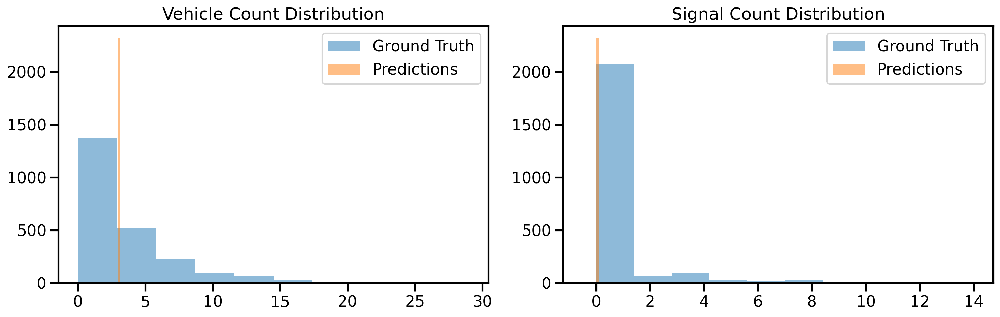

In [83]:
# Evaluate on training dataset
#print("Evaluating training dataset...")
model = YOLO('yolov8x.pt')
val_results = evaluate_dataset(model, val_dataset)
# Print results
print("\Val Dataset Results:")
print(f"Weighted MSE: {val_results['weighted_mse']:.4f}")
print(f"Vehicle MSE: {val_results['vehicle_mse']:.4f}")
print(f"Signal MSE: {val_results['signal_mse']:.4f}")

# Optional: Visualize distribution of predictions vs ground truth
plt.figure(figsize=(15, 5))

# Vehicle counts distribution
plt.subplot(1, 2, 1)
plt.hist(val_results['ground_truth']['vehicles'], alpha=0.5, label='Ground Truth')
plt.hist(val_results['predictions']['vehicles'], alpha=0.5, label='Predictions')
plt.title('Vehicle Count Distribution')
plt.legend()

# Signal counts distribution
plt.subplot(1, 2, 2)
plt.hist(val_results['ground_truth']['signals'], alpha=0.5, label='Ground Truth')
plt.hist(val_results['predictions']['signals'], alpha=0.5, label='Predictions')
plt.title('Signal Count Distribution')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Evaluate on training dataset
#print("Evaluating training dataset...")
test_results = evaluate_dataset(model, test_dataset)
# Print results
print("\nTest Dataset Results:")
print(f"Weighted MSE: {test_results['weighted_mse']:.4f}")
print(f"Vehicle MSE: {test_results['vehicle_mse']:.4f}")
print(f"Signal MSE: {test_results['signal_mse']:.4f}")

# Optional: Visualize distribution of predictions vs ground truth
plt.figure(figsize=(15, 5))

# Vehicle counts distribution
plt.subplot(1, 2, 1)
plt.hist(test_results['ground_truth']['vehicles'], alpha=0.5, label='Ground Truth')
plt.hist(test_results['predictions']['vehicles'], alpha=0.5, label='Predictions')
plt.title('Vehicle Count Distribution')
plt.legend()

# Signal counts distribution
plt.subplot(1, 2, 2)
plt.hist(test_results['ground_truth']['signals'], alpha=0.5, label='Ground Truth')
plt.hist(test_results['predictions']['signals'], alpha=0.5, label='Predictions')
plt.title('Signal Count Distribution')
plt.legend()

plt.tight_layout()
plt.show()

37it [01:14,  2.00s/it]

# Saving the model and predictions

In [81]:
from ultralytics import YOLO
import numpy as np
from tqdm import tqdm

def score_predict(model, dataset):
    # Initialize arrays to store all predictions and ground truth
    all_true_vehicles = []
    all_true_signals = []
    all_pred_vehicles = []
    all_pred_signals = []
    
    # Define vehicle and signal classes
    vehicle_classes = [2, 3, 4, 5, 6, 7, 8]
    signal_classes = [9, 11]
    
    # Process each batch
    for batch_x, batch_y in tqdm(dataset):
        # Get ground truth
        true_vehicles = batch_y[0].numpy()
        true_signals = batch_y[1].numpy()
        
        # Process each image in the batch
        batch_pred_vehicles = []
        batch_pred_signals = []
        
        for img in batch_x:
            # Convert tensor to numpy array if needed
            if isinstance(img, tf.Tensor):
                img = img.numpy()
            
            # Perform inference
            #results = model.predict(source=img, conf=0.25, verbose=False)
            results = model.predict(
                source=image_path,
                conf=0.5,  # Confidence threshold
                iou=0.4,  # Adjust IOU threshold
                classes=vehicle_classes + signal_classes,  # Only detect vehicles and signals
                verbose=False
            )
            result = results[0]
            
            # Count objects
            vehicle_count = sum(1 for box in result.boxes if int(box.cls[0]) in vehicle_classes)
            signal_count = sum(1 for box in result.boxes if int(box.cls[0]) in signal_classes)
            
            batch_pred_vehicles.append(vehicle_count)
            batch_pred_signals.append(signal_count)
        
        # Append batch results
        all_pred_vehicles.extend(batch_pred_vehicles)
        all_pred_signals.extend(batch_pred_signals)
    
    # Convert to numpy arrays
    all_pred_vehicles = np.array(all_pred_vehicles)
    all_pred_signals = np.array(all_pred_signals)
        
    return {
        'predictions': {
            'vehicles': all_pred_vehicles,
            'signals': all_pred_signals
        },
    }

# Load model
model = YOLO('yolov8x.pt')
#
# Evaluate on training dataset
#print("Evaluating training dataset...")
#train_results = evaluate_dataset(model, train_dataset)
score_y_hat = score_predict(model, score_dataset)


{'weighted_mse': 9.261617900172118,
 'vehicle_mse': 15.879518072289157,
 'signal_mse': 2.6437177280550777,
 'predictions': {'vehicles': array([3, 3, 3, ..., 3, 3, 3]),
  'signals': array([0, 0, 0, ..., 0, 0, 0])},
 'ground_truth': {'vehicles': array([1, 6, 1, ..., 8, 1, 5], dtype=int32),
  'signals': array([0, 3, 0, ..., 2, 0, 0], dtype=int32)}}

In [11]:
from ultralytics import YOLO
import numpy as np
from tqdm import tqdm
import pandas as pd

def score_predict(model, dataset):
    # Initialize arrays to store predictions
    all_pred_vehicles = []
    all_pred_signals = []
    
    # Define vehicle and signal classes
    vehicle_classes = [2, 3, 4, 5, 6, 7, 8]
    signal_classes = [9, 11]
    
    # Process each batch
    for batch_x in tqdm(dataset, desc="Processing batches"):
        # Process each image in the batch
        for img in batch_x:
            # Convert tensor to numpy array if needed
            if isinstance(img, tf.Tensor):
                img = img.numpy()
            
            # Perform inference
            results = model.predict(
                source=img,
                conf=0.5,
                iou=0.4,
                classes=vehicle_classes + signal_classes,
                verbose=False
            )
            result = results[0]
            
            # Count objects
            vehicle_count = sum(1 for box in result.boxes if int(box.cls[0]) in vehicle_classes)
            signal_count = sum(1 for box in result.boxes if int(box.cls[0]) in signal_classes)
            
            # Append individual predictions
            all_pred_vehicles.append(vehicle_count)
            all_pred_signals.append(signal_count)
    
    # Create DataFrame with the required format
    score_y_hat = pd.DataFrame({
        'signal': all_pred_signals,
        'vehicle': all_pred_vehicles
    })
    
    return score_y_hat

# Load model
model = YOLO('yolov8x.pt')

# Generate predictions
score_y_hat = score_predict(model, score_dataset)

# Verify the output format
assert type(score_y_hat) == pd.DataFrame
assert score_y_hat.shape == (score_metadata.shape[0], 2)
assert (score_y_hat.columns == ['signal', 'vehicle']).all()

Processing batches: 181it [05:56,  1.97s/it]


In [13]:
# Save your predictions on the Score segment as a Pandas data frame into a variable named `score_y_hat`.
# The data frame should contain 2 columns: signal and vehicle.
# The following is an EXAMPLE of what this data frame could be.
score_y_hat = pd.DataFrame({
    'signal': [0] * score_metadata.shape[0],
    'vehicle': [0] * score_metadata.shape[0]
})


# Use the following asserts to check the type and shape of the final predictions.
assert type(score_y_hat) == pd.DataFrame
assert score_y_hat.shape == (score_metadata.shape[0], 2)
assert (score_y_hat.columns == ['signal', 'vehicle']).all()

# Use the following code to save the final predictions.
import os 
model_dir = 'carnet_model'
os.makedirs(model_dir, exist_ok=True)
score_y_hat.to_parquet(f'{model_dir}/score_y_hat.parquet')

# Save model definition:
import json
#with open(f'{model_dir}/keras_model.json', 'w') as f:
#    model_json = json.dumps(json.loads(model.to_json()), indent=True)
#    f.write(model_json)

# Save the learned parameters.
#model.save_weights(f"{model_dir}/keras_parameters.weights.h5")

AttributeError: 'YOLO' object has no attribute 'to_json'

In [10]:
# Next, save each model's defition (JSON file) and parameters (H5 file).

In [11]:
# You now have the following files to be submit:
# 1. This notebook and any other Python code you used to train the final model.
# 2. definitions of all trained models
# 3. parameters of all trained models
# 4. score_y_hat.parquet - the model's output on the score segment